In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm, skew
import scipy.stats
import numpy as np
from scipy.special import logit, expit
import warnings
warnings.filterwarnings('ignore')
sns.set(style="darkgrid")
%matplotlib inline

sns.set_style('ticks')

import sklearn

In [14]:
from sklearn.datasets import load_breast_cancer
breast_center = load_breast_cancer()

In [29]:
# こんな感じでdataは自分で定義しろ
data = pd.DataFrame(data=breast_center.data, columns=breast_center.feature_names)
data_target = pd.DataFrame(data=breast_center.target, columns=['true_or_false'])

In [30]:
data

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990,10.38,122.80,1001.0,0.11840,0.27760,0.300100,0.147100,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.71190,0.26540,0.4601,0.11890
1,20.570,17.77,132.90,1326.0,0.08474,0.07864,0.086900,0.070170,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.24160,0.18600,0.2750,0.08902
2,19.690,21.25,130.00,1203.0,0.10960,0.15990,0.197400,0.127900,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.45040,0.24300,0.3613,0.08758
3,11.420,20.38,77.58,386.1,0.14250,0.28390,0.241400,0.105200,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.68690,0.25750,0.6638,0.17300
4,20.290,14.34,135.10,1297.0,0.10030,0.13280,0.198000,0.104300,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.40000,0.16250,0.2364,0.07678
5,12.450,15.70,82.57,477.1,0.12780,0.17000,0.157800,0.080890,0.2087,0.07613,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.53550,0.17410,0.3985,0.12440
6,18.250,19.98,119.60,1040.0,0.09463,0.10900,0.112700,0.074000,0.1794,0.05742,...,22.880,27.66,153.20,1606.0,0.14420,0.25760,0.37840,0.19320,0.3063,0.08368
7,13.710,20.83,90.20,577.9,0.11890,0.16450,0.093660,0.059850,0.2196,0.07451,...,17.060,28.14,110.60,897.0,0.16540,0.36820,0.26780,0.15560,0.3196,0.11510
8,13.000,21.82,87.50,519.8,0.12730,0.19320,0.185900,0.093530,0.2350,0.07389,...,15.490,30.73,106.20,739.3,0.17030,0.54010,0.53900,0.20600,0.4378,0.10720
9,12.460,24.04,83.97,475.9,0.11860,0.23960,0.227300,0.085430,0.2030,0.08243,...,15.090,40.68,97.65,711.4,0.18530,1.05800,1.10500,0.22100,0.4366,0.20750


In [32]:
data_target

,true_or_false
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,0
9,0


In [28]:
# それぞれの要素の説明が出る 平均値や最大値最小値など
data.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


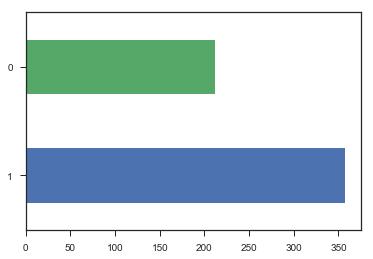

In [38]:
# 分布が出せる
data_score_distribution = data_target['true_or_false'].value_counts()
data_score_distribution.plot.barh()

In [40]:
# correlationを出せる
data.corr()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
mean radius,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
mean texture,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
mean perimeter,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
mean area,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
mean smoothness,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
mean compactness,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
mean concavity,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
mean concave points,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
mean symmetry,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413
mean fractal dimension,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.253691,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297


In [42]:
# 散布図がどうなってるかの傾向を見る 特徴量の大きさに依存するのでじじいはこんなに細かくならない
sns.pairplot(data, size=5)

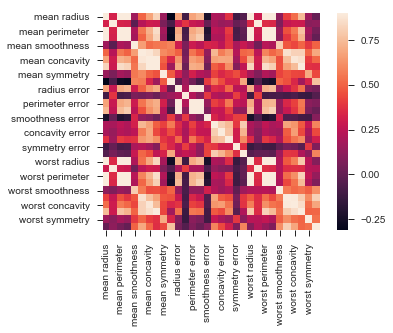

In [44]:
# 特徴量同士の相関が高いものは赤く表示されるし，相関が少ないものは黒くなってたりする 
sns.heatmap(data.corr(), vmax=0.9, square=True)

In [45]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve

from autosklearn.regression import AutoSklearnRegressor

import statsmodels.api as sm
from statsmodels.formula.api import glm

In [47]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler

# RobustScaler : 平均を0にし,標準偏差を1に設定する所謂正規化を実施したいときに使う

In [63]:
Logistic = make_pipeline(RobustScaler(), LogisticRegression())
RF = make_pipeline(RobustScaler(), RandomForestClassifier())
MLP = make_pipeline(RobustScaler(), MLPClassifier())

In [52]:
#Validation function 3-foldで10repeats
n_folds = 3
n_repeats = 10
def rmsle_cv(model,train, y_train, num=10):
    kf = RepeatedKFold(n_folds,n_repeats=n_repeats, random_state=12).get_n_splits(train.values)
    rmse = np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    print(rmse)
    return rmse

In [65]:
# ref: https://scikit-learn.org/stable/modules/model_evaluation.html

# CVの結果を吐き出せる(accuracy, precision, true_pos, true_neg, false_pos, false_neg)

from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score

def tn(y_true, y_pred): return confusion_matrix(y_true, y_pred)[0, 0]
def fp(y_true, y_pred): return confusion_matrix(y_true, y_pred)[0, 1]
def fn(y_true, y_pred): return confusion_matrix(y_true, y_pred)[1, 0]
def tp(y_true, y_pred): return confusion_matrix(y_true, y_pred)[1, 1]

scoring = {'accuracy': make_scorer(accuracy_score),'prec': 'precision',
           'tp': make_scorer(tp), 'tn': make_scorer(tn),
           'fp': make_scorer(fp), 'fn': make_scorer(fn)}

cv_results_logistic = cross_validate(Logistic, data, data_target, scoring=scoring, cv=5)
cv_results_rf = cross_validate(RF, data, data_target, scoring=scoring, cv=5)
cv_results_mlp = cross_validate(MLP, data, data_target, scoring=scoring, cv=5)

print(cv_results_logistic)
print(cv_results_rf)
print(cv_results_mlp)

{'fit_time': array([0.00730491, 0.00501776, 0.00565982, 0.00509524, 0.00501227]), 'score_time': array([0.00527596, 0.00408292, 0.00474811, 0.00442815, 0.00562787]), 'test_accuracy': array([0.97391304, 0.97391304, 0.98230088, 0.97345133, 0.99115044]), 'train_accuracy': array([0.99118943, 0.98898678, 0.98903509, 0.99122807, 0.98684211]), 'test_prec': array([0.98591549, 0.97260274, 0.97260274, 0.97222222, 1.        ]), 'train_prec': array([0.98615917, 0.98951049, 0.98281787, 0.98958333, 0.98275862]), 'test_tp': array([70, 71, 71, 70, 70]), 'train_tp': array([285, 283, 286, 285, 285]), 'test_tn': array([42, 41, 40, 40, 42]), 'train_tn': array([165, 166, 165, 167, 165]), 'test_fp': array([1, 2, 2, 2, 0]), 'train_fp': array([4, 3, 5, 3, 5]), 'test_fn': array([2, 1, 0, 1, 1]), 'train_fn': array([0, 2, 0, 1, 1])}
{'fit_time': array([0.08344483, 0.01893711, 0.022053  , 0.03338122, 0.02766228]), 'score_time': array([0.01982713, 0.01125073, 0.01037693, 0.00942492, 0.01598477]), 'test_accuracy': a

In [76]:
# ref : http://popo.ara.black/etc/confusionmatrix.htm
# 混同行列（Confusion Matrix）とは， クラス分類の結果をまとめた表

import itertools
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from sklearn.metrics import f1_score

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

f1_score(macro) : 0.94773664700047
f1_score(micro) : 0.951048951048951
f1_score(weighted) : 0.9511409594947423
Confusion matrix, without normalization
[[50  3]
 [ 4 86]]
Normalized confusion matrix
[[0.94 0.06]
 [0.04 0.96]]


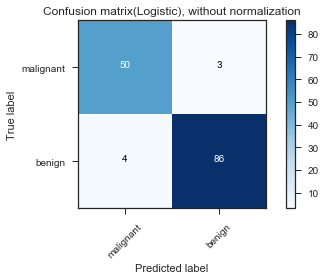

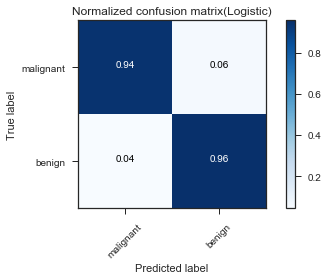

In [77]:
# Logisticでやって見る
X = data
y = data_target
class_names = breast_center.target_names

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

y_pred = Logistic.fit(X_train, y_train).predict(X_test)

print("f1_score(macro) : " + str(f1_score(y_test, y_pred, average='macro')))
print("f1_score(micro) : " + str(f1_score(y_test, y_pred, average='micro')))
print("f1_score(weighted) : " + str(f1_score(y_test, y_pred, average='weighted')))

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix(Logistic), without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix(Logistic)')

plt.show()

f1_score(macro) : 0.9195355261138677
f1_score(micro) : 0.9230769230769231
f1_score(weighted) : 0.9239032490349693
Confusion matrix, without normalization
[[51  2]
 [ 9 81]]
Normalized confusion matrix
[[0.96 0.04]
 [0.1  0.9 ]]


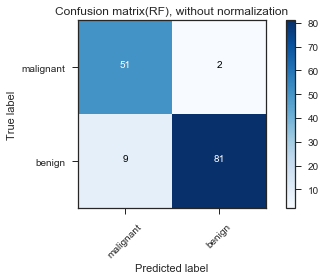

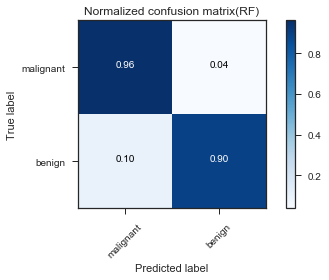

In [79]:
# RFでやって見る
X = data
y = data_target
class_names = breast_center.target_names

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

y_pred = RF.fit(X_train, y_train).predict(X_test)

print("f1_score(macro) : " + str(f1_score(y_test, y_pred, average='macro')))
print("f1_score(micro) : " + str(f1_score(y_test, y_pred, average='micro')))
print("f1_score(weighted) : " + str(f1_score(y_test, y_pred, average='weighted')))

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix(RF), without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix(RF)')

plt.show()

f1_score(macro) : 0.94773664700047
f1_score(micro) : 0.951048951048951
f1_score(weighted) : 0.9511409594947423
Confusion matrix, without normalization
[[50  3]
 [ 4 86]]
Normalized confusion matrix
[[0.94 0.06]
 [0.04 0.96]]


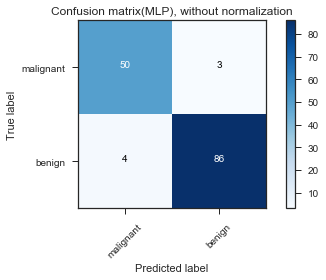

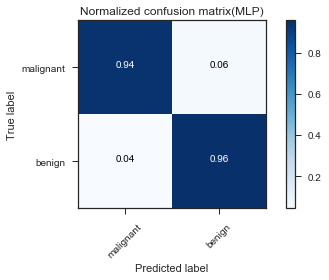

In [78]:
# MLPでやって見る
X = data
y = data_target
class_names = breast_center.target_names

# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

y_pred = MLP.fit(X_train, y_train).predict(X_test)

print("f1_score(macro) : " + str(f1_score(y_test, y_pred, average='macro')))
print("f1_score(micro) : " + str(f1_score(y_test, y_pred, average='micro')))
print("f1_score(weighted) : " + str(f1_score(y_test, y_pred, average='weighted')))

# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix(MLP), without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix(MLP)')

plt.show()